# Assignment 3: Autoencoders

For this assignment, alongwith the jupyter notebook you have to submit the weight files corresponding to each part i.e 6 weight files (mention the drive link containing these files at the start of the notebook). You also have to submit a .py file of assignment. You can download this jupyter notebook as a py file. 

google drive link: https://drive.google.com/drive/folders/1zkaTui-AYUXsP0Rvh4uNUm8zPTL5nvLU?usp=sharing

In [ ]:
import glob
import os
import cv2
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from torchvision import models, transforms
from torchsummary import summary
import matplotlib.pyplot as plt
# My own imports
from torchvision.transforms import ToTensor
%matplotlib inline
import time
import os
import copy
import torch.nn.functional as F
from google.colab.patches import cv2_imshow

In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

cpu


### Part 1: Image Completion

Image Completion is the task of filling missing parts of a given image with the help of information from the known parts of the image. This is an application that takes an image with a missing part as input and gives a completed image as the result.

We will be using Autoencoder to do this task. We will train our network on Images with missing parts passed with true images so that autoencoder generate an image with the missing parts.

### Data

The data we are using is [Flickr-Faces-HQ Dataset (FFHQ)](https://github.com/NVlabs/ffhq-dataset). It is an unlabelled dataset used for training GANs and other image generation algorithms. The original dataset has images of size 1024 by 1024 but we have only taken 128 by 128 images. Please download the dataset from this link (https://drive.google.com/drive/folders/1tg-Ur7d4vk1T8Bn0pPpUSQPxlPGBlGfv?usp=sharing)

Since the dataset is large (contains 70,000 image), you'll have to write a DataLoader that loads the data. For this you'll be using the Dataset and DataLoader class that are available in pytorch. For reference, you can get help from this link (https://pytorch.org/tutorials/beginner/basics/data_tutorial.html)

The input to the network will consist of a image that is modified as shown below. The output label will be the original image.

![title](images/face_dataset.png)

In [ ]:
# Mount drive 
from google.colab import drive
drive.mount('/content/gdrive')

In [ ]:
# Training and Test Datasets - save file paths
# code here

image_path = []
files = glob.glob("/content/gdrive/MyDrive/Deep Learning/A3/thumbnails128x128/**/*", recursive = False)

for file in files:
  image_path.append(file)

# set train-test ratio, 
train_ratio = 0.2

train_path = image_path[:int(len(image_path)*train_ratio)]
test_path = image_path[int(len(image_path)*train_ratio):]
validation_path = test_path[int(len(test_path)*0.95):]
test_path = test_path[:int(len(test_path)*0.95)]
print("Length of train sataset {}".format(len(train_path)))
print("Length of validation sataset {}".format(len(validation_path)))
print("Length of test sataset {}".format(len(test_path)))

Length of train sataset 14000
Length of validation sataset 2800
Length of test sataset 53200


In [ ]:
# check shape of a random image
img = cv2.imread(train_path[1])
print("Image Shape:", img.shape)
print(np.transpose(img).shape)

Image Shape: (128, 128, 3)
(3, 128, 128)


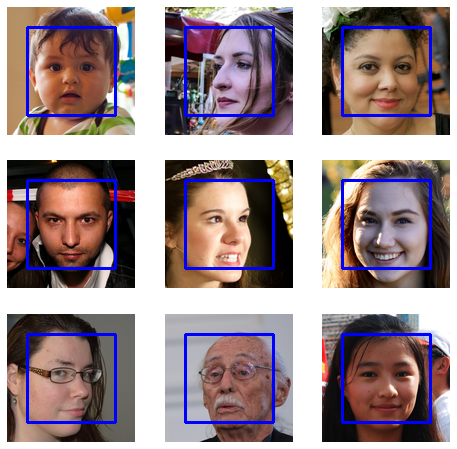

In [ ]:
# Edit input images to add white rectangle

# Step 1: specify a region to add the white rectangle https://www.geeksforgeeks.org/python-opencv-cv2-rectangle-method/

# print random images from train dataset
figure = plt.figure(figsize=(8, 8))
cols, rows = 3, 3
for i in range(1, cols * rows + 1):
    sample_idx = torch.randint(len(train_path), size=(1,)).item()
    img = train_path[sample_idx] # image path
    img = cv2.imread(img) # read the image
    figure.add_subplot(rows, cols, i)
    start_point = (20, 20)  # top left corner of rectangle
    end_point = (108, 108) # bottom right corner of rectangle
    color = (255, 0, 0) # Blue color in BGR
    # Line thickness of 2 px
    thickness = 2
    # Using cv2.rectangle() method
    # Draw a rectangle with blue line borders of thickness of 2 px
    image = cv2.rectangle(img, start_point, end_point, color, thickness)
    plt.axis("off")
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB), cmap="gray")
plt.show()

A random white box of length 20 x 20 will be created in this space of the blue line border. Blue line border position details are as follows:
- Top left corner of pixel: 20,20
- Bottom right corner of pixel: 108,108

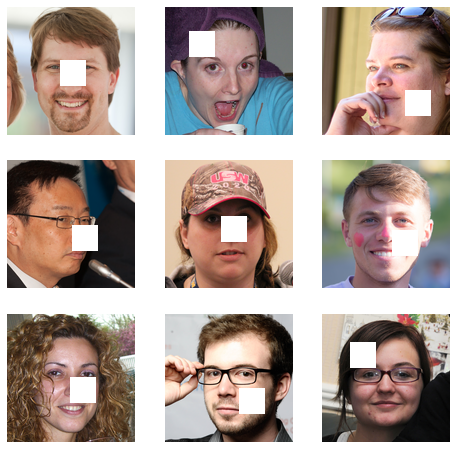

In [ ]:
import random
# Edit input images to add white rectangle

# Step 2: randomly add a 20x20 white rectangle

# print random images from train dataset
figure = plt.figure(figsize=(8, 8))
cols, rows = 3, 3
for i in range(1, cols * rows + 1):
    sample_idx = torch.randint(len(train_path), size=(1,)).item()
    img = train_path[sample_idx] # image path
    img = cv2.imread(img) # read the image
    figure.add_subplot(rows, cols, i)
    start_index = random.randint(20,83)
    start_point = (start_index, start_index)  # top left corner of rectangle
    end_point = (start_index+25, start_index+25) # bottom right corner of rectangle
    color = (255, 255, 255) # White color
    # Line thickness of -1 fills entire shape
    thickness = -1
    # Using cv2.rectangle() method
    # Draw a rectangle with blue line borders of thickness of 2 px
    image = cv2.rectangle(img, start_point, end_point, color, thickness)
    plt.axis("off")
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB), cmap="gray")
plt.show()

#### Edit Dataset class: Face Data

In [ ]:
# Converting data to torch.FloatTensor
transform = transforms.ToTensor()

In [ ]:
class FaceData(Dataset):
    def __init__(self, img_dir, transform=None): # add additional parameters needed to load the dataset e.g dataset path
        # your code here.
        self.img_dir = img_dir
        self.transform = transform

    def __len__(self):
        # your code here
        return len(self.img_dir)


    def __getitem__(self, idx):
        # your code here
        img_path = self.img_dir[idx]
        noise_img = self.add_white_rectangle(img_path)
        real_img = self.ground_truth_image(img_path)
        if self.transform:
            real_img = self.transform(real_img)
            noise_img = self.transform(noise_img)
        #print(real_img.shape)
        #print("noise",noise_img.shape)
        return noise_img, real_img # the output image is the label

    def add_white_rectangle(self, image_path):
        img = cv2.imread(image_path) # read the image
        start_index = random.randint(20,83)
        start_point = (start_index, start_index)  # top left corner of rectangle
        end_point = (start_index+25, start_index+25) # bottom right corner of rectangle
        color = (255, 255, 255) # White color
        # Line thickness of -1 fills entire shape
        thickness = -1
        # Using cv2.rectangle() method
        # Draw a rectangle with blue line borders of thickness of 2 px
        image = cv2.rectangle(img, start_point, end_point, color, thickness)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = image.astype(np.float32)/255
        return image

    def ground_truth_image(self, image_path):
        im_cv = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)
        im_cv = im_cv.astype(np.float32)/255
        return im_cv


      

You will define your autoencoder model here. For defining your custom model, you will find this link useful (https://pytorch.org/tutorials/beginner/examples_nn/two_layer_net_module.html).

Note: For the decoder, you'll have to look into nn.ConvTranspose2d function for upsampling.

#### Auto-Encoder model definition

In [ ]:
class ImageCompletionNet(nn.Module):
    def __init__(self):

        super().__init__()
        
        self.encoder = nn.Sequential(
          
          nn.Conv2d(3, 16, 3, stride=1, padding=1),
          nn.MaxPool2d(2, 2),
          nn.ReLU(),
        
          nn.Conv2d(16, 32, 3, stride=1, padding=1),
          nn.ReLU(),

          nn.Conv2d(32, 64, 3, stride=1, padding=1),
          nn.MaxPool2d(2, 2),
          nn.ReLU(),

          nn.Conv2d(64, 128, 3, stride=1, padding=1),
          nn.ReLU()
        )

        self.decoder = torch.nn.Sequential(
            nn.ConvTranspose2d(128, 64, 5, stride=2, padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(64, 32, 3, stride=2, padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(32, 16, 2, stride=2, padding = 1),
            nn.ReLU(),
            nn.ConvTranspose2d(16, 3, 3, stride=1, padding = 1),
            nn.MaxPool2d(2, 2),
            nn.Sigmoid()
        )

    def forward(self, x):
        x = self.encoder(x)
        return self.decoder(x)

In [ ]:
# GPU or CPU
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# declare model class intance
model = ImageCompletionNet().to(device)

# Print your model here using summary from torchsummary
summary(model,input_size=(3,128,128))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 16, 128, 128]             448
         MaxPool2d-2           [-1, 16, 64, 64]               0
              ReLU-3           [-1, 16, 64, 64]               0
            Conv2d-4           [-1, 32, 64, 64]           4,640
              ReLU-5           [-1, 32, 64, 64]               0
            Conv2d-6           [-1, 64, 64, 64]          18,496
         MaxPool2d-7           [-1, 64, 32, 32]               0
              ReLU-8           [-1, 64, 32, 32]               0
            Conv2d-9          [-1, 128, 32, 32]          73,856
             ReLU-10          [-1, 128, 32, 32]               0
  ConvTranspose2d-11           [-1, 64, 65, 65]         204,864
             ReLU-12           [-1, 64, 65, 65]               0
  ConvTranspose2d-13         [-1, 32, 129, 129]          18,464
             ReLU-14         [-1, 32, 1

Load the data using Custom Dataset class defined above and load your DataLoader. Divide the whole dataset into train, validation and test set.


In [ ]:
# create Datasets
training_data = FaceData(train_path, transform)
test_data = FaceData(test_path, transform)
validation_data = FaceData(validation_path, transform)

# create Data-Loader
train_dataloader = DataLoader(training_data, batch_size=128, shuffle=True, num_workers=2)
validation_dataloader = DataLoader(validation_data, batch_size=128, shuffle=True, num_workers=2)
# test_dataloader = DataLoader(test_data, batch_size=256, shuffle=True, num_workers=2)

# create dictionary for input to train_model function
dataloaders_dict = {'train': train_dataloader, 'val': validation_dataloader}

Define your training pipeline and evaluate your model using the validation loss. The choice of loss function and the hyperparameters is left at your discretion

In [ ]:
# Hyper-parameters
epochs = 15
learning_rate = 0.001
#Loss function
criterion = nn.MSELoss()

#Optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

In [ ]:
def train_model(model, dataloaders, criterion, optimizer, num_epochs=25, is_inception=False):
    since = time.time()

    val_loss_history = []

    best_model_wts = copy.deepcopy(model.state_dict())
    best_loss = 1000000000

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            #running_corrects = 0

            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    # Get model outputs and calculate loss
                    # Special case for inception because in training it has an auxiliary output. In train
                    #   mode we calculate the loss by summing the final output and the auxiliary output
                    #   but in testing we only consider the final output.
                    if is_inception and phase == 'train':
                        # From https://discuss.pytorch.org/t/how-to-optimize-inception-model-with-auxiliary-classifiers/7958
                        outputs, aux_outputs = model(inputs)
                        loss1 = criterion(outputs, labels)
                        loss2 = criterion(aux_outputs, labels)
                        loss = loss1 + 0.4*loss2
                    else:
                        outputs = model(inputs)
                        loss = criterion(outputs, labels)

                    # _, preds = torch.max(outputs, 1)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                # running_corrects += torch.sum(preds == labels.data)

            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            # epoch_acc = running_corrects.double() / len(dataloaders[phase].dataset)

            print('{} Loss: {:.4f}'.format(phase, epoch_loss))

            # deep copy the model
            if phase == 'val' and epoch_loss < best_loss:
                best_loss = epoch_loss
                best_model_wts = copy.deepcopy(model.state_dict())
            if phase == 'val':
                val_loss_history.append(epoch_loss)
            model_path = '/content/gdrive/MyDrive/Deep Learning/A3/model_{}_{}_{}_{}'.format("Part", "A", "1", "epoch")
            torch.save(model.state_dict(), model_path) 
        print()

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}'.format(best_loss))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model, val_loss_history

In [ ]:
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

In [ ]:
model, hist = train_model(model, dataloaders_dict, criterion, optimizer, num_epochs=epochs, is_inception=False)

Epoch 0/14
----------
train Loss: 0.0060
val Loss: 0.0026

Epoch 1/14
----------
train Loss: 0.0024
val Loss: 0.0024

Epoch 2/14
----------
train Loss: 0.0024
val Loss: 0.0023

Epoch 3/14
----------
train Loss: 0.0023
val Loss: 0.0023

Epoch 4/14
----------
train Loss: 0.0023
val Loss: 0.0023

Epoch 5/14
----------
train Loss: 0.0023
val Loss: 0.0023

Epoch 6/14
----------
train Loss: 0.0023
val Loss: 0.0022

Epoch 7/14
----------
train Loss: 0.0023
val Loss: 0.0022

Epoch 8/14
----------
train Loss: 0.0022
val Loss: 0.0022

Epoch 9/14
----------
train Loss: 0.0022
val Loss: 0.0022

Epoch 10/14
----------
train Loss: 0.0022
val Loss: 0.0025

Epoch 11/14
----------
train Loss: 0.0022
val Loss: 0.0022

Epoch 12/14
----------
train Loss: 0.0022
val Loss: 0.0058

Epoch 13/14
----------
train Loss: 0.0066
val Loss: 0.0029

Epoch 14/14
----------
train Loss: 0.0027
val Loss: 0.0026

Training complete in 39m 15s
Best val Acc: 0.002154


Load your model using the weights you obtained from training and evaluate them on the test dataset. Your results will be evaluated on the basis of the image completion results. You will need to display your incomplete image along with the results in the form of 5x2 matrix (You can pick any random 5 images for display. Your image selector should be written as a method that generates random samples for testing)

In [ ]:
# Save the model's state
model_path = '/content/gdrive/MyDrive/Deep Learning/A3/model_{}_{}_{}'.format("Part", "A", "3")
torch.save(model.state_dict(), model_path) 

In [ ]:
# Load model
model_path = '/content/gdrive/MyDrive/DL_A3_22100001/model_Part_A'
model = ImageCompletionNet().to(device)
model.load_state_dict(torch.load(model_path))

<All keys matched successfully>

In [ ]:
import random
test_dataloader = DataLoader(test_data, batch_size=1, shuffle=True, num_workers=2)

def evaluate_model(model, test_dataloader):

  model.eval()
  with torch.no_grad():
  
    y_pred = []
    y_true = []
    input = []
  
    for i in range(5):
      image, label = next(iter(test_dataloader))
      image = torch.tensor(image)
      images = image.to(device)
      label = label.to(device)
      outputs = model(images)
      # outputs are the prediction done by the model

      if i == 0:
        y_pred = outputs.cpu().numpy()
        y_true = label.cpu().numpy()
        input = image.cpu().numpy()
      else:
        y_pred = np.concatenate((y_pred, outputs.cpu().numpy()), axis=2)
        y_true = np.concatenate((y_true, label.cpu().numpy()), axis=2)
        input = np.concatenate((input, image.cpu().numpy()), axis=2)

    y_pred = np.concatenate((y_true, input, y_pred), axis=3)
    y_pred = y_pred * 255
    y_pred = np.transpose(np.squeeze(y_pred.astype(np.int32)))
    y_pred = np.transpose(y_pred, (1,0,2))
    figure = plt.figure(figsize=(20, 15))
    plt.imshow(y_pred)



Output:
- Left column: Original Image
- Middle column: Image with white box
- Right Column: Completed image

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:15: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  from ipykernel import kernelapp as app


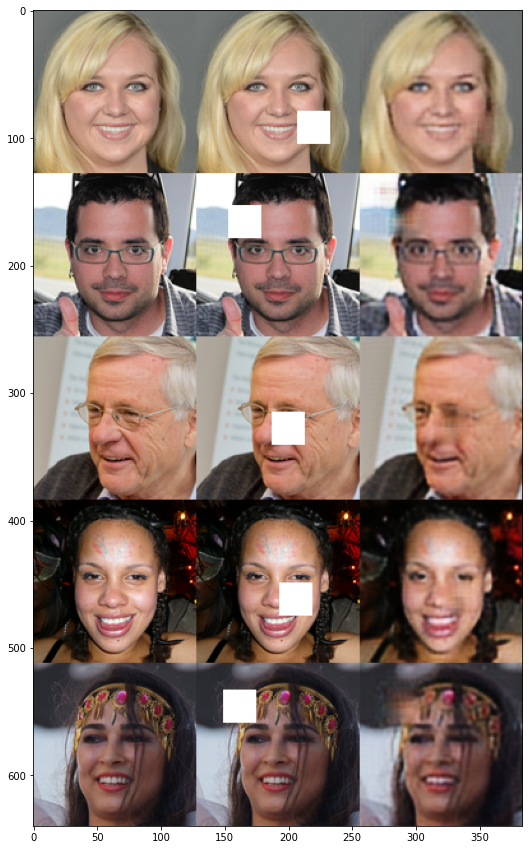

In [ ]:
evaluate_model(model, test_dataloader)

# Part 2: Image Denoising

An application of autoencoders includes image denoising. For this part you'll be using the person dataset that is a subset of the COCO dataset. You can download the datset using this link (https://drive.google.com/file/d/1gHTLS6dvEp31X2dWBdLrvGr--5WOm1Z3/view?usp=sharing). You'll use the images present in the dataset and generate your own labels through adding salt and pepper noise to the image. Your input to the model will be the noisy image created through using functions from opencv library and output will be the original image.

NOTE: This part is important and part 3 of the assignment uses the model that you'll build for denoising.

#### Download and save image files

In [ ]:
!unzip /content/gdrive/MyDrive/"Deep Learning"/A3/person_dataset.zip -d /content/gdrive/MyDrive/"Deep Learning"/A3/part_b_images

#### Add salt and pepper noise to a set of test batch

In [ ]:
# code help taken from: https://stackoverflow.com/questions/22937589/how-to-add-noise-gaussian-salt-and-pepper-etc-to-image-in-python-with-opencv

def sp_noise(image,prob):
    '''
    Add salt and pepper noise to image
    prob: Probability of the noise
    '''
    output = np.zeros(image.shape,np.uint8)
    thres = 1 - prob 
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            rdn = random.random()
            if rdn < prob:
                output[i][j][0] = 0
                output[i][j][1] = 0
                output[i][j][2] = 0
            elif rdn > thres:
                output[i][j][0] = 255
                output[i][j][1] = 255
                output[i][j][2] = 255
                
            else:
                output[i][j][0] = image[i][j][0]
                output[i][j][1] = image[i][j][1]
                output[i][j][2] = image[i][j][2]
    return output

In [ ]:
# Training and Test Datasets - save file paths
# code here

image_path = []
files = glob.glob("/content/gdrive/MyDrive/Deep Learning/A3/part_b_images/person_dataset/images/*", recursive = False)

for file in files:
  image_path.append(file)

# set train-test ratio, 
train_ratio = 0.7

train_path = image_path[:int(len(image_path)*train_ratio)]
test_path = image_path[int(len(image_path)*train_ratio):]
validation_path = test_path[int(len(test_path)*0.5):]
test_path = test_path[:int(len(test_path)*0.5)]
print("Length of train sataset {}".format(len(train_path)))
print("Length of validation sataset {}".format(len(validation_path)))
print("Length of test sataset {}".format(len(test_path)))

Length of train sataset 7000
Length of validation sataset 1500
Length of test sataset 1500


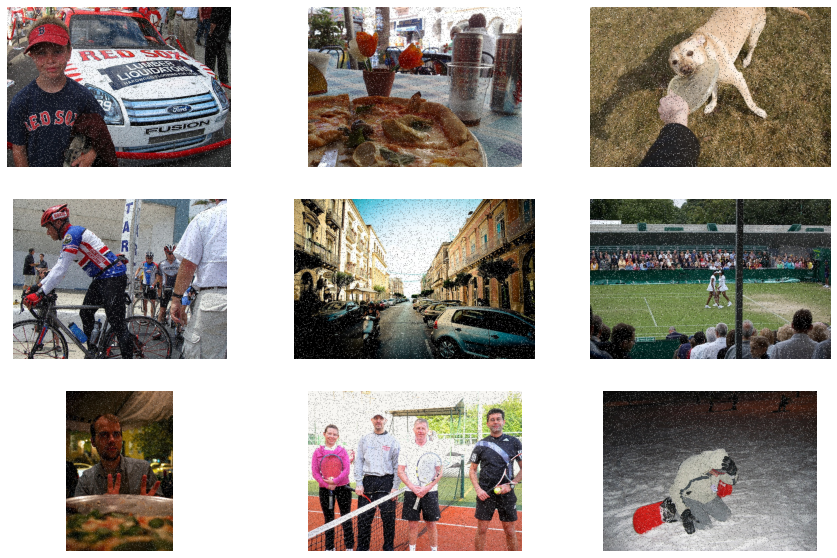

In [ ]:
# do test on random sample of images
import random
figure = plt.figure(figsize=(15, 10))
cols, rows = 3, 3
for i in range(1, cols * rows + 1):
    sample_idx = torch.randint(len(train_path), size=(1,)).item()
    img = train_path[sample_idx] # image path
    img = cv2.imread(img) # read the image
    figure.add_subplot(rows, cols, i)
    image = sp_noise(img, 0.03)
    plt.axis("off")
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB), cmap="gray")
plt.show()

In [ ]:
# Converting data to torch.FloatTensor
transform = transforms.ToTensor()

#### Dataset Class Definition

In [ ]:
# Define your Dataset Class here as done in Part 1
input_shape = (128,128)
class FaceDataB(Dataset):
    def __init__(self, img_dir, transform=None): # add additional parameters needed to load the dataset e.g dataset path
        # your code here.
        self.img_dir = img_dir
        self.transform = transform

    def __len__(self):
        # your code here
        return len(self.img_dir)


    def __getitem__(self, idx):
        # your code here
        img_path = self.img_dir[idx]
        noise_img = self.add_noise(img_path)
        real_img = self.ground_truth_image(img_path)
        if self.transform:
            real_img = self.transform(real_img)
            noise_img = self.transform(noise_img)
        #print(real_img.shape)
        #print("noise",noise_img.shape)
        return noise_img, real_img # the output image is the label

    def add_noise(self, image_path):
        """
        add salt and pepper noise
        """
        img = cv2.imread(image_path) # read the image
        img = cv2.resize(img, input_shape)
        image = sp_noise(img, 0.03)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = image.astype(np.float32)/255
        return image

    def ground_truth_image(self, image_path):
        im_cv = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)
        im_cv = cv2.resize(im_cv, input_shape)
        im_cv = im_cv.astype(np.float32)/255
        return im_cv

#### Model definition

In [ ]:
# Define your model here
class DenoiseNN(nn.Module):
    
    def __init__(self):

        super().__init__()
        
        self.encoder = nn.Sequential(
          
          nn.Conv2d(3, 16, 3, stride=1, padding=1),
          nn.MaxPool2d(2, 2),
          nn.ReLU(),
        
          nn.Conv2d(16, 32, 3, stride=1, padding=1),
          nn.ReLU(),

          nn.Conv2d(32, 64, 3, stride=1, padding=1),
          nn.MaxPool2d(2, 2),
          nn.ReLU(),

          nn.Conv2d(64, 128, 3, stride=1, padding=1),
          nn.ReLU()
        )

        self.decoder = torch.nn.Sequential(
            nn.ConvTranspose2d(128, 64, 5, stride=2, padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(64, 32, 3, stride=2, padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(32, 16, 2, stride=2, padding = 1),
            nn.ReLU(),
            nn.ConvTranspose2d(16, 3, 3, stride=1, padding = 1),
            nn.MaxPool2d(2, 2),
            nn.Sigmoid()
        )

    def forward(self, x):
        x = self.encoder(x)
        return self.decoder(x)

#### Model Training Function

In [ ]:
def train_model_B(model, dataloaders, criterion, optimizer, num_epochs=25, is_inception=False):
    since = time.time()

    val_loss_history = []

    best_model_wts = copy.deepcopy(model.state_dict())
    best_loss = 1000000000

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            #running_corrects = 0

            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    # Get model outputs and calculate loss
                    # Special case for inception because in training it has an auxiliary output. In train
                    #   mode we calculate the loss by summing the final output and the auxiliary output
                    #   but in testing we only consider the final output.
                    if is_inception and phase == 'train':
                        # From https://discuss.pytorch.org/t/how-to-optimize-inception-model-with-auxiliary-classifiers/7958
                        outputs, aux_outputs = model(inputs)
                        loss1 = criterion(outputs, labels)
                        loss2 = criterion(aux_outputs, labels)
                        loss = loss1 + 0.4*loss2
                    else:
                        outputs = model(inputs)
                        loss = criterion(outputs, labels)

                    # _, preds = torch.max(outputs, 1)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                # running_corrects += torch.sum(preds == labels.data)

            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            # epoch_acc = running_corrects.double() / len(dataloaders[phase].dataset)

            print('{} Loss: {:.4f}'.format(phase, epoch_loss))

            # deep copy the model
            if phase == 'val' and epoch_loss < best_loss:
                best_loss = epoch_loss
                best_model_wts = copy.deepcopy(model.state_dict())
            if phase == 'val':
                val_loss_history.append(epoch_loss)
            model_path = '/content/gdrive/MyDrive/Deep Learning/A3/model_{}_{}_{}_{}'.format("Part", "B", "1", "epoch")
            torch.save(model.state_dict(), model_path) 
        print()

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}'.format(best_loss))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model, val_loss_history

#### Create Model Class Instance

In [ ]:
# Print your model here using summary from torchsummary
# GPU or CPU
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(f'Selected device: {device}')

# declare model class intance
modelB = DenoiseNN().to(device)

# Print your model here using summary from torchsummary
print("Encoder Summary:")
summary(modelB,input_size=(3,128,128))

Selected device: cuda:0
Encoder Summary:
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 16, 128, 128]             448
         MaxPool2d-2           [-1, 16, 64, 64]               0
              ReLU-3           [-1, 16, 64, 64]               0
            Conv2d-4           [-1, 32, 64, 64]           4,640
              ReLU-5           [-1, 32, 64, 64]               0
            Conv2d-6           [-1, 64, 64, 64]          18,496
         MaxPool2d-7           [-1, 64, 32, 32]               0
              ReLU-8           [-1, 64, 32, 32]               0
            Conv2d-9          [-1, 128, 32, 32]          73,856
             ReLU-10          [-1, 128, 32, 32]               0
  ConvTranspose2d-11           [-1, 64, 65, 65]         204,864
             ReLU-12           [-1, 64, 65, 65]               0
  ConvTranspose2d-13         [-1, 32, 129, 129]          18,46

#### Create Datasets and Dataloaders

In [ ]:
# # create Datasets
training_data = FaceDataB(train_path, transform)
test_data = FaceDataB(test_path, transform)
validation_data = FaceDataB(validation_path, transform)

# create Data-Loader
train_dataloader = DataLoader(training_data, batch_size=64, shuffle=True, num_workers=2)
validation_dataloader = DataLoader(validation_data, batch_size=64, shuffle=True, num_workers=2)
# test_dataloader = DataLoader(test_data, batch_size=64, shuffle=True, num_workers=2)

# create dictionary for input to train_model function
dataloaders_dict = {'train': train_dataloader, 'val': validation_dataloader}

#### Training Pipeline

In [ ]:
# Hyper-parameters
epochs = 15
learning_rate = 0.001
#Loss function
criterion = nn.MSELoss()

#Optimizer
optim = torch.optim.Adam(modelB.parameters(), lr=learning_rate, weight_decay=1e-05)

In [ ]:
epochs = 5
modelB, hist = train_model_B(modelB, dataloaders_dict, criterion, optim, num_epochs=epochs, is_inception=False)

Epoch 0/4
----------
train Loss: 0.0118
val Loss: 0.0074

Epoch 1/4
----------
train Loss: 0.0072
val Loss: 0.0070

Epoch 2/4
----------


In [ ]:
# Save the model's state
model_path = '/content/gdrive/MyDrive/Deep Learning/A3/model_{}_{}_{}'.format("Part", "B", "2")
torch.save(modelB.state_dict(), model_path)  

In [ ]:
# Load model
model_path = '/content/gdrive/MyDrive/DL_A3_22100001/model_Part_B'
modelB = DenoiseNN().to(device)
modelB.load_state_dict(torch.load(model_path))
optim = torch.optim.Adam(modelB.parameters(), lr=learning_rate, weight_decay=1e-05)

Load your model using the weights you obtained from training and evaluate them on the test dataset. Your results will be evaluated on the basis of the image denoising results. You will need to display your noise images along with the results in the form of 5x2 matrix (You can pick any random 5 images for display. Your image selector should be written as a method that generates random samples for testing)

In [ ]:
# Your testing pipeline 
import random
test_dataloader = DataLoader(test_data, batch_size=1, shuffle=True, num_workers=2)

def evaluate_model(model, test_dataloader):

  modelB.eval()
  with torch.no_grad():
  
    y_pred = []
    y_true = []
    input = []
  
    for i in range(5):
      image, label = next(iter(test_dataloader))
      image = torch.tensor(image)
      images = image.to(device)
      label = label.to(device)
      outputs = model(images)
      # outputs are the prediction done by the model

      if i == 0:
        y_pred = outputs.cpu().numpy()
        y_true = label.cpu().numpy()
        input = image.cpu().numpy()
      else:
        y_pred = np.concatenate((y_pred, outputs.cpu().numpy()), axis=2)
        y_true = np.concatenate((y_true, label.cpu().numpy()), axis=2)
        input = np.concatenate((input, image.cpu().numpy()), axis=2)

    y_pred = np.concatenate((y_true, input, y_pred), axis=3)
    y_pred = y_pred * 255
    y_pred = np.transpose(np.squeeze(y_pred.astype(np.int32)))
    y_pred = np.transpose(y_pred, (1,0,2))
    figure = plt.figure(figsize=(20, 15))
    plt.imshow(y_pred)

Output:
- Left column: Original Image
- Middle column: Salt and Pepper image
- Right Column: denoised image

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  app.launch_new_instance()


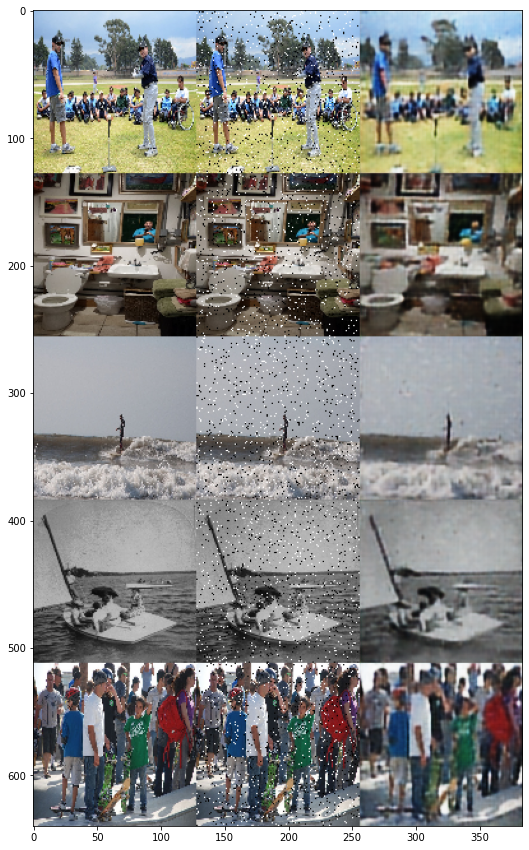

In [ ]:
evaluate_model(modelB, test_dataloader)

# Part 3: Background replacement/blur

Now that you're quite familiar with what encoders are, let's start with a real life example. Ever wondered how you can replace your background on zoom/google meet? How it actually works behind the scenes?

What these applications do is to run a segmentation model that detects humans and puts a mask on everything else. Although their models are highly optimised and light-weight (through pruning and quantization), we can build something similar with the current knowledge we have acquired in this course. 

For this part of the assignment, you'll build an application that successfully segments the person in the video using a Resnet 34 based UNET model. The output from the segmentation model will act as a mask which we'll use as a basis for changing background and adding blur using cv2.Gaussianblur.

The end goal of this part of the assignment is to record a video of yourself and perform background replacement/blurring alongwith the denoising that you have done in part 3. You're required to submit two processed videos (one with the background blur and the other with background replacement) otherwise marks would be deducted from the assignment

#### Load the model paths

In [ ]:
# Define your Dataset as done in part 2 with little modifications to the output labels 
# as now we'll have a binary mask for detecting humans.
# Training and Test Datasets - save file paths
# code here

torch.cuda.empty_cache()

data = []
label = []
data_paths = glob.glob("/content/gdrive/MyDrive/Deep Learning/A3/part_b_images/person_dataset/images/**", recursive = False)
label_paths = glob.glob("/content/gdrive/MyDrive/Deep Learning/A3/part_b_images/person_dataset/labels/**", recursive = False)

for file in data_paths:
  data.append(file)

for file in label_paths:
  label.append(file)

data.sort()
label.sort()

# set train-test ratio, 
train_ratio = 0.8

train_data_path = data[:int(len(data)*train_ratio)]
train_label_path = label[:int(len(label)*train_ratio)]

test_data_path = data[int(len(data)*train_ratio):]
test_label_path = label[int(len(label)*train_ratio):]

validation_data_path = test_data_path[int(len(test_data_path)*0.5):]
validation_label_path = test_label_path[int(len(test_label_path)*0.5):]

test_data_path = test_data_path[:int(len(test_data_path)*0.5)]
test_label_path = test_label_path[:int(len(test_label_path)*0.5)]

print("Length of train dataset: label:{}, data:{}".format(len(train_label_path), len(train_data_path)))
print("Length of test dataset: label:{}, data:{}".format(len(test_label_path), len(test_data_path)))
print("Length of validation dataset: label:{}, data:{}".format(len(validation_label_path), len(validation_data_path)))


Length of train dataset: label:8000, data:8000
Length of test dataset: label:1000, data:1000
Length of validation dataset: label:1000, data:1000


#### Dataset Class Definition


In [ ]:
# Converting data to torch.FloatTensor
transform = transforms.ToTensor()

In [ ]:
input_shape = (512,512)
class SegmentationData(Dataset):
    def __init__(self, data_dir, label_dir, transform=None): # add additional parameters needed to load the dataset e.g dataset path
        # your code here.
        self.data_dir = data_dir
        self.label_dir = label_dir
        self.transform = transform

    def __len__(self):
        # your code here
        return len(self.data_dir)


    def __getitem__(self, idx):
        # your code here
        
        data_path = self.data_dir[idx]
        label_path = self.label_dir[idx]
        
        data_img = self.preprocessing_data(data_path)
        label_img = self.preprocessing_label(label_path)

        if self.transform:
            data_img = self.transform(data_img)
            label_img = self.transform(label_img)

        return data_img, label_img # the output image is the label

    def preprocessing_data(self, image_path):
        im_cv = cv2.imread(image_path)
        im_cv = cv2.resize(im_cv, input_shape)
        im_cv = im_cv.astype(np.float32)/255
        return im_cv

    def preprocessing_label(self, image_path):
        im_cv = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
        im_cv = cv2.resize(im_cv, input_shape)
        im_cv = im_cv.astype(np.float32)/255
        return im_cv
        

#### DataLoader creation using DataSet class

In [ ]:
# create Datasets
training_data = SegmentationData(train_data_path, train_label_path, transform)
test_data = SegmentationData(test_data_path, test_label_path, transform)
validation_data = SegmentationData(validation_data_path, validation_data_path, transform)

# create Data-Loader
train_dataloader = DataLoader(training_data, batch_size=16, shuffle=True, num_workers=2)
validation_dataloader = DataLoader(validation_data, batch_size=16, shuffle=True, num_workers=2)

# create dictionary for input to train_model function
dataloaders_dict = {'train': train_dataloader, 'val': validation_dataloader}

### Resnet-34 UNET Model
You'll be required to build a resnet34 based UNET model. For this you'll be using the resnet34 model available in torchvision.models with pretrained weights enabled. A sample model based on an input size of 512x512 is shown below:

![title](images/unet.jpg)


In [ ]:
# Define your Model Here
class Unet_resnet_34(nn.Module):
    def __init__(self):

        super().__init__()
        
        resnet_34 = models.resnet34(pretrained=True)
        self.encoder_layers = list(resnet_34.children())
        self.encoder_layers = self.encoder_layers[:-2]

        self.enc_layer_1  = nn.Sequential(*self.encoder_layers[:3])
        self.enc_layer_2  = nn.Sequential(*self.encoder_layers[3:5])
        self.enc_layer_3  = nn.Sequential(*self.encoder_layers[5])
        self.enc_layer_4  = nn.Sequential(*self.encoder_layers[6])
        
        self.enc_layer_5  = nn.Sequential(*self.encoder_layers[7])

        self.dec_layer_1 = nn.Sequential(
            nn.ConvTranspose2d(512, 128, 3, stride=1, padding=1),
            nn.Upsample(scale_factor=2)
        )
        self.dec_layer_2 = nn.Sequential(
            nn.ConvTranspose2d(256, 128, 3, stride=1, padding=1),
            nn.Upsample(scale_factor=2)
        )
        self.dec_layer_3 = nn.Sequential(
            nn.ConvTranspose2d(256, 128, 3, stride=1, padding=1),
            nn.Upsample(scale_factor=2)
        )
        self.dec_layer_4 = nn.Sequential(
            nn.ConvTranspose2d(256, 128, 3, stride=1, padding=1),
            nn.Upsample(scale_factor=2)
        )
        self.dec_layer_5 = nn.Sequential(
            nn.ConvTranspose2d(256, 1, 3, stride=1, padding=1),
            nn.Upsample(scale_factor=2)
        )

        self.skip_1 = nn.Conv2d(64, 128, 1, stride=1, padding=0)
        self.skip_2 = nn.Conv2d(64, 128, 1, stride=1, padding=0)
        self.skip_3 = nn.Conv2d(128, 128, 1, stride=1, padding=0)
        self.skip_4 = nn.Conv2d(256, 128, 1, stride=1, padding=0)
        

    def forward(self, x):
        x = self.enc_layer_1(x)
        x_skip1 = self.skip_1(x)
        x = self.enc_layer_2(x)
        x_skip2 = self.skip_2(x)
        x = self.enc_layer_3(x)
        x_skip3 = self.skip_3(x)
        x = self.enc_layer_4(x)
        x_skip4 = self.skip_4(x)

        x = F.relu(self.enc_layer_5(x))

        x = self.dec_layer_1(x)
        # print(x_skip4.shape)
        x = F.relu(torch.cat((x_skip4, x),1))
        # print(x.shape)
        del x_skip4

        x = self.dec_layer_2(x)
        x = F.relu(torch.cat((x_skip3, x),1))
        del x_skip3

        x = self.dec_layer_3(x)
        x = F.relu(torch.cat((x_skip2, x),1))
        del x_skip2

        x = self.dec_layer_4(x)
        x = F.relu(torch.cat((x_skip1, x),1))
        del x_skip1

        return self.dec_layer_5(x)

#### Model Training Function

In [ ]:
def train_model_C(model, dataloaders, criterion, optimizer, num_epochs=25, is_inception=False):
    bce_weight = 0.
    since = time.time()

    val_loss_history = []

    best_model_wts = copy.deepcopy(model.state_dict())
    best_loss = 1000000000

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            #running_corrects = 0

            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train

                with torch.set_grad_enabled(phase == 'train'):
                    # Get model outputs and calculate loss
                    # Special case for inception because in training it has an auxiliary output. In train
                    #   mode we calculate the loss by summing the final output and the auxiliary output
                    #   but in testing we only consider the final output.
                    outputs = model(inputs)
                    # print(outputs.shape)
                    # print(labels.shape)
                    loss = criterion(outputs, labels) * bce_weight + (1-bce_weight) * dice_loss(F.sigmoid(outputs), labels)

                    # _, preds = torch.max(outputs, 1)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                # running_corrects += torch.sum(preds == labels.data)

            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            # epoch_acc = running_corrects.double() / len(dataloaders[phase].dataset)

            print('{} Loss: {:.4f}'.format(phase, epoch_loss))

            # deep copy the model
            if phase == 'val' and epoch_loss < best_loss:
                best_loss = epoch_loss
                best_model_wts = copy.deepcopy(model.state_dict())
            if phase == 'val':
                val_loss_history.append(epoch_loss)
            model_path = '/content/gdrive/MyDrive/Deep Learning/A3/model_{}_{}_{}_{}'.format("Part", "C", "6", "epoch")
            torch.save(model.state_dict(), model_path) 
        print()

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}'.format(best_loss))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model, val_loss_history

In [ ]:
# Print your model here using summary from torchsummary
# GPU or CPU
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(f'Selected device: {device}')

# declare model class intance
modelC = Unet_resnet_34().to(device)

# Print your model here using summary from torchsummary
print("Encoder Summary:")
summary(modelC,input_size=(3,512,512))

Selected device: cuda:0
Encoder Summary:
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 256, 256]           9,408
       BatchNorm2d-2         [-1, 64, 256, 256]             128
              ReLU-3         [-1, 64, 256, 256]               0
            Conv2d-4        [-1, 128, 256, 256]           8,320
         MaxPool2d-5         [-1, 64, 128, 128]               0
            Conv2d-6         [-1, 64, 128, 128]          36,864
       BatchNorm2d-7         [-1, 64, 128, 128]             128
              ReLU-8         [-1, 64, 128, 128]               0
            Conv2d-9         [-1, 64, 128, 128]          36,864
      BatchNorm2d-10         [-1, 64, 128, 128]             128
             ReLU-11         [-1, 64, 128, 128]               0
       BasicBlock-12         [-1, 64, 128, 128]               0
           Conv2d-13         [-1, 64, 128, 128]          36,86

The training loss you'll be using for this part iors a combination of Dice loss and binary cross entropy. Binary cross entropy is available in pytorch whereas you'll have to write the DICE loss yourself. A good article to understand dice loss (https://medium.com/ai-salon/understanding-dice-loss-for-crisp-boundary-detection-bb30c2e5f62b). The dice loss is mentioned below

![title](images/dice.png)


In [ ]:
# Define your dice + bce loss here
def dice_loss(pred, target, smooth=1):

    iflat = pred.view(-1)
    tflat = target.view(-1)
    intersection = (iflat * tflat).sum()
    
    return 1 - ((2. * intersection + smooth) /
              (iflat.sum() + tflat.sum() + smooth))
    
#Loss function
criterion = nn.BCEWithLogitsLoss()

In [ ]:
# Define your training pipeline here
# Hyper-parameters
epochs = 16
learning_rate = 0.001

#Optimizer
optim = torch.optim.Adam(modelC.parameters(), lr=learning_rate, weight_decay=1e-05)

In [ ]:
epochs = 17
modelC, hist = train_model_C(modelC, dataloaders_dict, criterion, optim, num_epochs=epochs, is_inception=False)

Epoch 0/16
----------


/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:1806: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


train Loss: 0.1280
val Loss: 2.6643

Epoch 1/16
----------
train Loss: 0.1204
val Loss: 2.9602

Epoch 2/16
----------
train Loss: 0.1097
val Loss: 2.4100

Epoch 3/16
----------
train Loss: 0.1081
val Loss: 2.6724

Epoch 4/16
----------
train Loss: 0.1142
val Loss: 2.6208

Epoch 5/16
----------
train Loss: 0.1044
val Loss: 2.7629

Epoch 6/16
----------
train Loss: 0.1091
val Loss: 2.8776

Epoch 7/16
----------
train Loss: 0.1032
val Loss: 2.8208

Epoch 8/16
----------
train Loss: 0.1065
val Loss: 2.6908

Epoch 9/16
----------
train Loss: 0.0976
val Loss: 2.8118

Epoch 10/16
----------
train Loss: 0.1025
val Loss: 2.5257

Epoch 11/16
----------


KeyboardInterrupt: ignored

In [ ]:
# Save the model's state
model_path = '/content/gdrive/MyDrive/Deep Learning/A3/model_{}_{}_{}'.format("Part", "C", "6")
torch.save(modelC.state_dict(), model_path)

Load your model using the weights you obtained from training and evaluate them on the test dataset. Your results will be evaluated on the basis of the segmentation masks created. You will need to display your original images along with their masks in the form of 5x2 matrix (You can pick any random 5 images for display. Your image selector should be written as a method that generates random samples for testing)

In [ ]:
# Load model

model_path = '/content/gdrive/MyDrive/Deep Learning/A3/model_{}_{}_{}'.format("Part", "C", "6_epoch")
modelC = Unet_resnet_34().to(device)
modelC.load_state_dict(torch.load(model_path))
optim = torch.optim.Adam(modelC.parameters(), lr=learning_rate, weight_decay=1e-05)

In [ ]:
# Define your testing pipeline here
# Your testing pipeline 
from google.colab.patches import cv2_imshow
import random
test_dataloader = DataLoader(test_data, batch_size=1, shuffle=True, num_workers=2)

def evaluate_model(modelC, test_dataloader):

  modelC.eval()

  with torch.no_grad():
  
    y_pred = 0
    y_true = 0
  
    for i in range(5):
      image, label = next(iter(test_dataloader))
      image = torch.tensor(image)
      images = image.to(device)
      label = label.to(device)
      outputs = modelC(images)

      if i == 0:
        y_pred = F.sigmoid(outputs).cpu().numpy()
        y_true = label.cpu().numpy()
      else:
        y_pred = np.concatenate((y_pred, F.sigmoid(outputs).cpu().numpy()), axis=2)
        y_true = np.concatenate((y_true, label.cpu().numpy()), axis=2)

    y_pred = np.concatenate((y_pred, y_true), axis=3)
    y_pred = y_pred * 255
    y_pred[y_pred>130] = 255
    y_pred[y_pred<=130] = 0 
    y_pred = (np.squeeze(y_pred.astype(np.int32)))

    
    cv2_imshow(y_pred)

Left Column: model predicted images, Right Column: Actual Labels converted to greyscale

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


(2560, 1024)


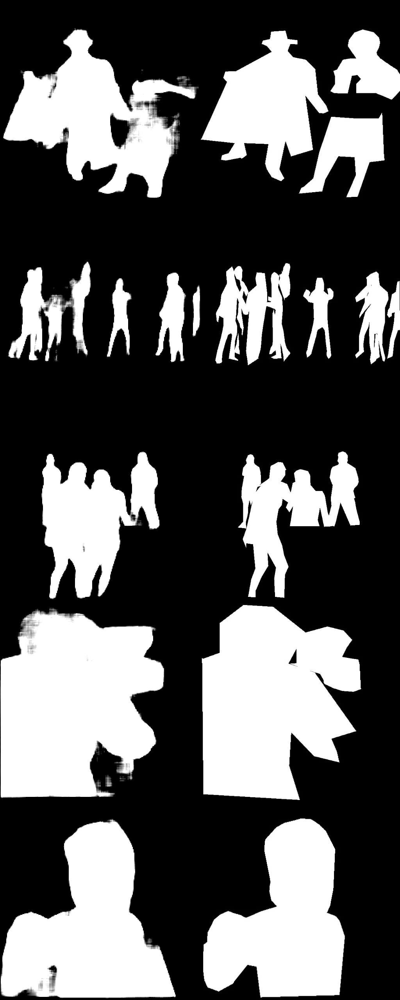

In [ ]:
evaluate_model(modelC, test_dataloader)

### Completing the pipeline
Now that you've successfully built your segmentation model, we can move onto the exciting part where we'll be using the segmentation mask obtained from the model to blur/replace the background.

NOTE: For background replacement, you can use any picture of your choice (Surprise me!)

In [ ]:
def background_blur(image, segmentation_model):
    
    img_shape = image.shape[:-1]
    im_cv = image.astype(np.float32)/255
    
    im_cv = cv2.resize(im_cv, (512,512))
    im_cv = transform(im_cv)
    im_cv = im_cv.to(device)
    im_cv = im_cv.unsqueeze(0)
    outputs = segmentation_model(im_cv)

    y_pred = F.sigmoid(outputs).cpu().detach().numpy()
    y_pred = y_pred * 255
    y_pred = (np.squeeze(y_pred.astype(np.float32)))
    y_pred = cv2.resize(y_pred, (image.shape[1], image.shape[0])).astype(np.uint8)

    # sharepn the segmentation map
    y_pred[y_pred>230] = 255
    y_pred[y_pred<=230] = 0 

    # create mask
    arrays = [y_pred, y_pred, y_pred]
    mapping = np.stack(arrays, axis=2)
    
    

    blurred_original_image = cv2.GaussianBlur(image,(29,29),0)
   
    layered_image = np.where(mapping != (0,0,0), 
                         image, 
                         blurred_original_image)
    
    return layered_image


def background_replacement(image, new_background, segmentation_model):
    img_shape = image.shape[:-1]
    im_cv = image.astype(np.float32)/255
    
    im_cv = cv2.resize(im_cv, (512,512))
    im_cv = transform(im_cv)
    im_cv = im_cv.to(device)
    im_cv = im_cv.unsqueeze(0)
    outputs = segmentation_model(im_cv)

    y_pred = F.sigmoid(outputs).cpu().detach().numpy()
    y_pred = y_pred * 255
    y_pred = (np.squeeze(y_pred.astype(np.float32)))
    y_pred = cv2.resize(y_pred, (image.shape[1], image.shape[0])).astype(np.uint8)

    # sharepn the segmentation map
    y_pred[y_pred>230] = 255
    y_pred[y_pred<=230] = 0 

    # create mask
    arrays = [y_pred, y_pred, y_pred]
    mapping = np.stack(arrays, axis=2)
    

    # blurred_original_image = cv2.GaussianBlur(image,(29,29),0)
    new_background = cv2.resize(new_background, (img_shape[1], img_shape[0]))
   
    background_replaced_image = np.where(mapping != (0,0,0), 
                         image, 
                         new_background)
    return background_replaced_image

#### Image with blurred background

Original Image


/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:1806: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


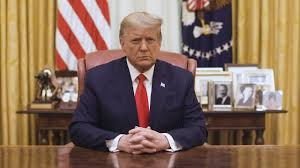

Blurred Image


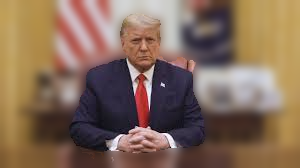

In [ ]:
im_cv = cv2.imread("/content/gdrive/MyDrive/Deep Learning/A3/donald_img.jpg")
layered_image = background_blur(im_cv, modelC)
print("Original Image")
cv2_imshow(im_cv)
print("Blurred Image")
cv2_imshow(layered_image)

#### Image with background modified

Original Image


/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:1806: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


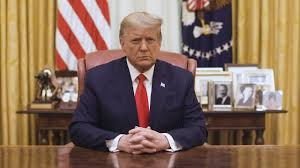

New Background Image


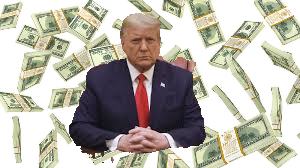

In [ ]:
image = cv2.imread("/content/gdrive/MyDrive/Deep Learning/A3/donald_img.jpg")
background = cv2.imread("/content/gdrive/MyDrive/Deep Learning/A3/background_trump.jpg")
new_img = background_replacement(image, background, modelC)
print("Original Image")
cv2_imshow(im_cv)
print("New Background Image")
cv2_imshow(new_img)

Now that you have successfully created some methods that can replace/blur the background. We can move on to building the complete pipeline. Record a video of your self (10 seconds long). Add salt and pepper noise to it as done in part 2 of the assignment. First perform a denoising using the denoising model we created in part 2 on all the frames of the video and then use the methods defined above to blur and replace the background.  

In [ ]:
# Define your video processing pipeline here

background = cv2.imread("/content/gdrive/MyDrive/Deep Learning/A3/beach_background.jpg")

# code help taken from: https://learnopencv.com/read-write-and-display-a-video-using-opencv-cpp-python/

video_path = "/content/gdrive/MyDrive/DL_A3_22100001/video_original.mp4"
# Create a VideoCapture object
cap = cv2.VideoCapture(video_path)

fps = cap.get(cv2.CAP_PROP_FPS)

# Check if camera opened successfully
if (cap.isOpened() == False):
  print("Unable to read camera feed")

# Default resolutions of the frame are obtained.The default resolutions are system dependent.
# We convert the resolutions from float to integer.
frame_width = int(cap.get(3))
frame_height = int(cap.get(4))

# Define the codec and create VideoWriter object.The output is stored in 'outpy.avi' file.
out1 = cv2.VideoWriter('/content/gdrive/MyDrive/Deep Learning/A3/blurred.avi',cv2.VideoWriter_fourcc('M','J','P','G'), fps, (frame_width,frame_height))
out2 = cv2.VideoWriter('/content/gdrive/MyDrive/Deep Learning/A3/background_replaced.avi',cv2.VideoWriter_fourcc('M','J','P','G'), fps, (frame_width,frame_height))

while(True):
  ret, frame = cap.read()
 
  if ret == True:
     
    # Write the frame into the file 'output.avi'
    blurr = background_blur(frame, modelC)
    replaced = background_replacement(frame, background, modelC)
    out1.write(blurr)
    out2.write(replaced)
 
    # Display the resulting frame 
    # cv2_imshow(blurr)
    # cv2_imshow(replaced)
 
    # Press Q on keyboard to stop recording
    # if cv2.waitKey(1) & 0xFF == ord('q'):
    #   break
 
  # Break the loop
  else:
    break 
 
# When everything done, release the video capture and video write objects
cap.release()
out1.release()
out2.release()
 
# Closes all the frames
cv2.destroyAllWindows()



/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:1806: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


# Part 4: Background blur via Autoencoders

Hurray! Now that now you're here, you should be proud of yourself that you built your first real world application through using AI. What you're supposed to do in this part of the assignment is to use the model you created in Part 3 and extend that to reconstruct images with a blurred background instead of adding a post-processing pipeline to achieve this (hint: change the number of classes in the final layer).

You will be using the same person dataset that you have used in the previous parts but now instead of predicting output masks, you'll be predicting images with blurred background. You can generate the output labels for this task using the blurring pipeline you made in part 3.

In [ ]:
# Define your Dataset class here
from google.colab.patches import cv2_imshow
import random
torch.cuda.empty_cache()

data = []
label = []
data_paths = glob.glob("/content/gdrive/MyDrive/Deep Learning/A3/part_b_images/person_dataset/images/**", recursive = False)
label_paths = glob.glob("/content/gdrive/MyDrive/Deep Learning/A3/part_b_images/person_dataset/labels/**", recursive = False)

for file in data_paths:
  data.append(file)

for file in label_paths:
  label.append(file)

data.sort()
label.sort()

# set train-test ratio, 
train_ratio = 0.8

train_data_path = data[:int(len(data)*train_ratio)]
train_label_path = label[:int(len(label)*train_ratio)]

test_data_path = data[int(len(data)*train_ratio):]
test_label_path = label[int(len(label)*train_ratio):]

validation_data_path = test_data_path[int(len(test_data_path)*0.5):]
validation_label_path = test_label_path[int(len(test_label_path)*0.5):]

test_data_path = test_data_path[:int(len(test_data_path)*0.5)]
test_label_path = test_label_path[:int(len(test_label_path)*0.5)]

print("Length of train dataset: label:{}, data:{}".format(len(train_label_path), len(train_data_path)))
print("Length of test dataset: label:{}, data:{}".format(len(test_label_path), len(test_data_path)))
print("Length of validation dataset: label:{}, data:{}".format(len(validation_label_path), len(validation_data_path)))

Length of train dataset: label:8000, data:8000
Length of test dataset: label:1000, data:1000
Length of validation dataset: label:1000, data:1000


Original Image


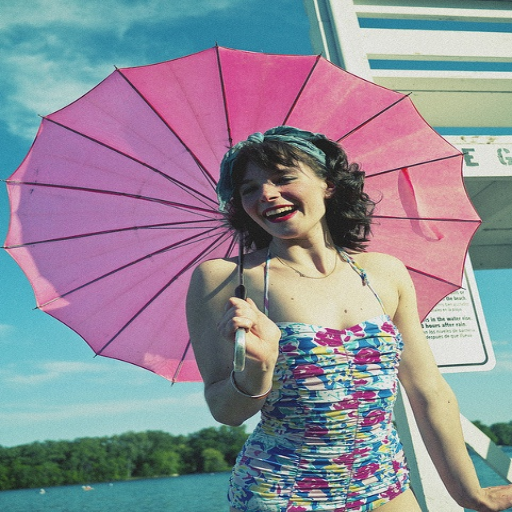

Blurred Image


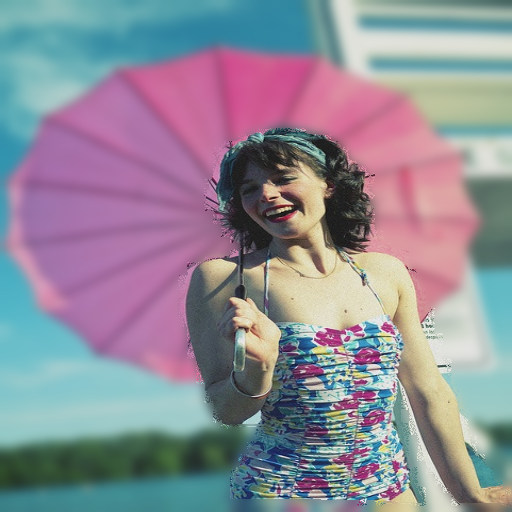

In [ ]:
# sample background blurr
input_shape = (512,512)
im_cv = cv2.imread(train_data_path[0])
mask = cv2.imread(train_label_path[0])
image = cv2.resize(im_cv, input_shape)
mask = cv2.resize(mask, input_shape)

print("Original Image")
cv2_imshow( image)

blurred_original_image = cv2.GaussianBlur(image,(31,31),0)

layered_image = np.where(mask != (0,0,0), 
                    image, 
                    blurred_original_image)
print("Blurred Image")
cv2_imshow(layered_image)

In [ ]:
# Converting data to torch.FloatTensor
transform = transforms.ToTensor()

input_shape = (512,512)
class BlurData(Dataset):
    def __init__(self, data_dir, label_dir, transform=None): # add additional parameters needed to load the dataset e.g dataset path
        # your code here.
        self.data_dir = data_dir
        self.label_dir = label_dir
        self.transform = transform

    def __len__(self):
        # your code here
        return len(self.data_dir)


    def __getitem__(self, idx):
        # your code here
        
        data_path = self.data_dir[idx]
        label_path = self.label_dir[idx]
        
        data_img = self.preprocessing_data(data_path)
        label_img = self.preprocessing_label(data_path, label_path)

        if self.transform:
            data_img = self.transform(data_img)
            label_img = self.transform(label_img)

        return data_img, label_img # the output image is the label

    def preprocessing_data(self, image_path):
        im_cv = cv2.imread(image_path)
        im_cv = cv2.resize(im_cv, input_shape)
        im_cv = im_cv.astype(np.float32)/255
        return im_cv

    def preprocessing_label(self, data_path, label_path):
        im_cv = cv2.imread(data_path)
        mask = cv2.imread(label_path)
        image = cv2.resize(im_cv, input_shape)
        mask = cv2.resize(mask, input_shape)

        blurred_original_image = cv2.GaussianBlur(image,(31,31),0)

        layered_image = np.where(mask != (0,0,0), 
                            image, 
                            blurred_original_image)
        # "Blurred Image"
        # cv2_imshow(layered_image)
        im_cv = cv2.resize(layered_image, input_shape)
        im_cv = im_cv.astype(np.float32)/255
        return im_cv

#### DataLoader creation using DataSet class

In [ ]:
# create Datasets
training_data = BlurData(train_data_path, train_label_path, transform)
test_data = BlurData(test_data_path, test_label_path, transform)
validation_data = BlurData(validation_data_path, validation_data_path, transform)

# create Data-Loader
train_dataloader = DataLoader(training_data, batch_size=64, shuffle=True, num_workers=2)
validation_dataloader = DataLoader(validation_data, batch_size=64, shuffle=True, num_workers=2)

# create dictionary for input to train_model function
dataloaders_dict = {'train': train_dataloader, 'val': validation_dataloader}

### Resnet-34 UNET Model

Use similar model architecture as Task 3 but with different output classes


In [ ]:
# Define your Model Here
class Unet_resnet_34_Blur(nn.Module):
    def __init__(self):

        super().__init__()
        
        resnet_34 = models.resnet34(pretrained=True)
        self.encoder_layers = list(resnet_34.children())
        self.encoder_layers = self.encoder_layers[:-2]

        self.enc_layer_1  = nn.Sequential(*self.encoder_layers[:3])
        self.enc_layer_2  = nn.Sequential(*self.encoder_layers[3:5])
        self.enc_layer_3  = nn.Sequential(*self.encoder_layers[5])
        self.enc_layer_4  = nn.Sequential(*self.encoder_layers[6])
        
        self.enc_layer_5  = nn.Sequential(*self.encoder_layers[7])

        self.dec_layer_1 = nn.Sequential(
            nn.ConvTranspose2d(512, 128, 3, stride=1, padding=1),
            nn.Upsample(scale_factor=2)
        )
        self.dec_layer_2 = nn.Sequential(
            nn.ConvTranspose2d(256, 128, 3, stride=1, padding=1),
            nn.Upsample(scale_factor=2)
        )
        self.dec_layer_3 = nn.Sequential(
            nn.ConvTranspose2d(256, 128, 3, stride=1, padding=1),
            nn.Upsample(scale_factor=2)
        )
        self.dec_layer_4 = nn.Sequential(
            nn.ConvTranspose2d(256, 128, 3, stride=1, padding=1),
            nn.Upsample(scale_factor=2)
        )
        self.dec_layer_5 = nn.Sequential(
            nn.ConvTranspose2d(256, 3, 3, stride=1, padding=1),
            nn.Upsample(scale_factor=2)
        )

        self.skip_1 = nn.Conv2d(64, 128, 1, stride=1, padding=0)
        self.skip_2 = nn.Conv2d(64, 128, 1, stride=1, padding=0)
        self.skip_3 = nn.Conv2d(128, 128, 1, stride=1, padding=0)
        self.skip_4 = nn.Conv2d(256, 128, 1, stride=1, padding=0)
        

    def forward(self, x):
        x = self.enc_layer_1(x)
        x_skip1 = self.skip_1(x)
        x = self.enc_layer_2(x)
        x_skip2 = self.skip_2(x)
        x = self.enc_layer_3(x)
        x_skip3 = self.skip_3(x)
        x = self.enc_layer_4(x)
        x_skip4 = self.skip_4(x)

        x = F.relu(self.enc_layer_5(x))

        x = self.dec_layer_1(x)
        # print(x_skip4.shape)
        x = F.relu(torch.cat((x_skip4, x),1))
        # print(x.shape)
        del x_skip4

        x = self.dec_layer_2(x)
        x = F.relu(torch.cat((x_skip3, x),1))
        del x_skip3

        x = self.dec_layer_3(x)
        x = F.relu(torch.cat((x_skip2, x),1))
        del x_skip2

        x = self.dec_layer_4(x)
        x = F.relu(torch.cat((x_skip1, x),1))
        del x_skip1

        return F.sigmoid(self.dec_layer_5(x))

#### Model Training Function

In [ ]:
def train_model_D(model, dataloaders, criterion, optimizer, num_epochs=25, is_inception=False):
    bce_weight = 0.
    since = time.time()

    val_loss_history = []

    best_model_wts = copy.deepcopy(model.state_dict())
    best_loss = 1000000000

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            #running_corrects = 0

            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train

                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                # running_corrects += torch.sum(preds == labels.data)

            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            # epoch_acc = running_corrects.double() / len(dataloaders[phase].dataset)

            print('{} Loss: {:.4f}'.format(phase, epoch_loss))

            # deep copy the model
            if phase == 'val' and epoch_loss < best_loss:
                best_loss = epoch_loss
                best_model_wts = copy.deepcopy(model.state_dict())
            if phase == 'val':
                val_loss_history.append(epoch_loss)
            model_path = '/content/gdrive/MyDrive/Deep Learning/A3/model_{}_{}_{}_{}'.format("Part", "D", "1", "epoch")
            torch.save(model.state_dict(), model_path) 
        print()

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}'.format(best_loss))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model, val_loss_history

#### Create Model Class Instance

In [ ]:
# print your model here with summary from torchsummary
# Print your model here using summary from torchsummary
# GPU or CPU
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(f'Selected device: {device}')

# declare model class intance
modelD = Unet_resnet_34_Blur().to(device)

# Print your model here using summary from torchsummary
print("Encoder Summary:")
summary(modelD,input_size=(3,512,512))

Selected device: cuda:0
Encoder Summary:
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 256, 256]           9,408
       BatchNorm2d-2         [-1, 64, 256, 256]             128
              ReLU-3         [-1, 64, 256, 256]               0
            Conv2d-4        [-1, 128, 256, 256]           8,320
         MaxPool2d-5         [-1, 64, 128, 128]               0
            Conv2d-6         [-1, 64, 128, 128]          36,864
       BatchNorm2d-7         [-1, 64, 128, 128]             128
              ReLU-8         [-1, 64, 128, 128]               0
            Conv2d-9         [-1, 64, 128, 128]          36,864
      BatchNorm2d-10         [-1, 64, 128, 128]             128
             ReLU-11         [-1, 64, 128, 128]               0
       BasicBlock-12         [-1, 64, 128, 128]               0
           Conv2d-13         [-1, 64, 128, 128]          36,86

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:1806: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


In [ ]:
# Write your training pipeline here

# Hyper-parameters
epochs = 16
learning_rate = 0.001

#Loss function
criterion = nn.MSELoss()

#Optimizer
optim = torch.optim.Adam(modelD.parameters(), lr=learning_rate, weight_decay=1e-05)

In [ ]:
modelD, hist = train_model_D(modelD, dataloaders_dict, criterion, optim, num_epochs=epochs, is_inception=False)

Epoch 0/15
----------


/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:1806: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


train Loss: 0.0501
val Loss: 0.0104

Epoch 1/15
----------
train Loss: 0.0039
val Loss: 0.0096

Epoch 2/15
----------
train Loss: 0.0035
val Loss: 0.0093

Epoch 3/15
----------
train Loss: 0.0034
val Loss: 0.0097

Epoch 4/15
----------
train Loss: 0.0033
val Loss: 0.0092

Epoch 5/15
----------
train Loss: 0.0033
val Loss: 0.0089

Epoch 6/15
----------
train Loss: 0.0032
val Loss: 0.0090

Epoch 7/15
----------
train Loss: 0.0033
val Loss: 0.0091

Epoch 8/15
----------
train Loss: 0.0031
val Loss: 0.0091

Epoch 9/15
----------
train Loss: 0.0031
val Loss: 0.0092

Epoch 10/15
----------
train Loss: 0.0030
val Loss: 0.0090

Epoch 11/15
----------
train Loss: 0.0032
val Loss: 0.0094

Epoch 12/15
----------
train Loss: 0.0031
val Loss: 0.0090

Epoch 13/15
----------
train Loss: 0.0030
val Loss: 0.0091

Epoch 14/15
----------
train Loss: 0.0033
val Loss: 0.0091

Epoch 15/15
----------
train Loss: 0.0030
val Loss: 0.0091

Training complete in 61m 50s
Best val Acc: 0.008909


In [ ]:
# Save the model's state
model_path = '/content/gdrive/MyDrive/Deep Learning/A3/model_{}_{}_{}'.format("Part", "D", "1")
torch.save(modelD.state_dict(), model_path)

Load your model using the weights you obtained from training and evaluate them on the test dataset. Your results will be evaluated on the basis of the blurred images created. You will need to display your original images along with their background blurred couterparts in the form of 5x2 matrix (You can pick any random 5 images for display. Your image selector should be written as a method that generates random samples for testing)

In [ ]:
# Load model

model_path = '/content/gdrive/MyDrive/Deep Learning/A3/model_{}_{}_{}'.format("Part", "D", "1")
modelD = Unet_resnet_34_Blur().to(device)
modelD.load_state_dict(torch.load(model_path))
optim = torch.optim.Adam(modelD.parameters(), lr=learning_rate, weight_decay=1e-05)

In [ ]:
# Write your testing pipeline here
import random
test_dataloader = DataLoader(test_data, batch_size=1, shuffle=True, num_workers=2)

def evaluate_model(model, test_dataloader):

  modelD.eval()
  with torch.no_grad():
  
    y_pred = []
    y_true = []
    input = []
  
    for i in range(5):
      image, label = next(iter(test_dataloader))
      image = torch.tensor(image)
      images = image.to(device)
      label = label.to(device)
      outputs = model(images)
      # outputs are the prediction done by the model

      if i == 0:
        y_pred = outputs.cpu().numpy()
        y_true = label.cpu().numpy()
        input = image.cpu().numpy()
      else:
        y_pred = np.concatenate((y_pred, outputs.cpu().numpy()), axis=2)
        y_true = np.concatenate((y_true, label.cpu().numpy()), axis=2)
        input = np.concatenate((input, image.cpu().numpy()), axis=2)

    y_pred = np.concatenate((input, y_true, y_pred), axis=3)
    y_pred = y_pred * 255
    y_pred = np.transpose(np.squeeze(y_pred.astype(np.int32)))
    y_pred = np.transpose(y_pred, (1,0,2))
    figure = plt.figure(figsize=(20, 15))
    cv2_imshow(y_pred)



Output:
- Left column: Original Image
- Middle column: Blur background image
- Right Column: Reconstructed image

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  app.launch_new_instance()
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:1806: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


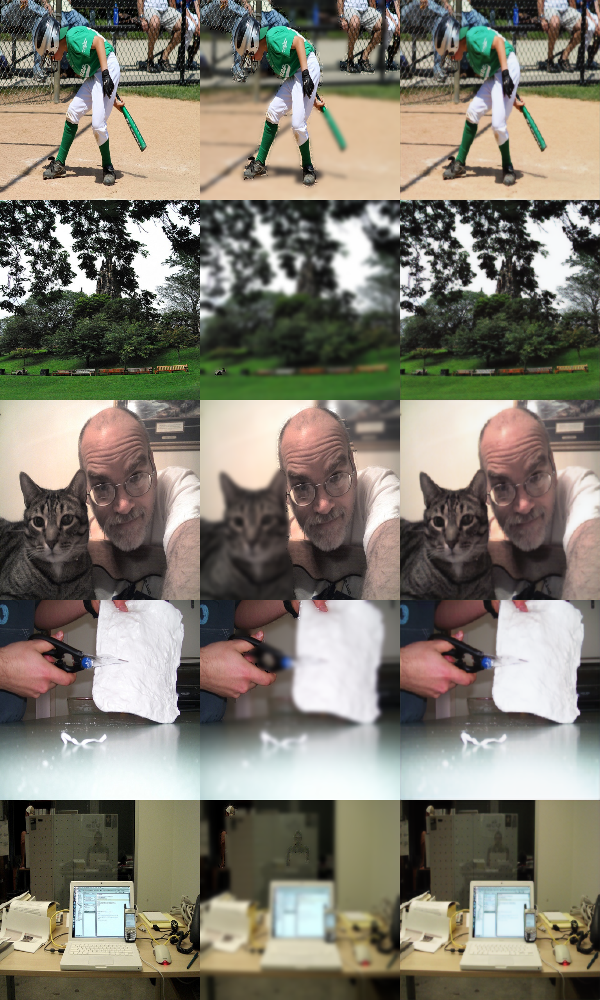

<Figure size 1440x1080 with 0 Axes>

In [ ]:
evaluate_model(modelD, test_dataloader)

# Part 5: OpenVino Model Optimisation

You have to optimise one of the neural networks that you trained in programming assignment 2 using OpenVino toolkit as described in the tutorial. You have to produce weights for FP16 and FP32 precision. You also have to report the inference time of both models and verify that the pytorch's output is same as optimised model's.